# Used Car Prices CarGurus lightGBM GPU
# Optuna Hyperparameter Optimization

## Set Up Environment, Read Data, Split Train/Test Sets

In [ ]:
from google.colab import drive 
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%cd /content/drive/MyDrive/UsedCarsCarGurus/ML/lightGBM/

/content/drive/MyDrive/UsedCarsCarGurus/ML/lightGBM


In [ ]:
# Clone lightGBM
!git clone --recursive https://github.com/Microsoft/LightGBM

Cloning into 'LightGBM'...
remote: Enumerating objects: 25590, done.
remote: Counting objects: 100% (25590/25590), done.
remote: Compressing objects: 100% (5980/5980), done.
remote: Total 25590 (delta 18996), reused 25081 (delta 18734), pack-reused 0
Receiving objects: 100% (25590/25590), 18.53 MiB | 7.30 MiB/s, done.
Resolving deltas: 100% (18996/18996), done.
Checking out files: 100% (516/516), done.
Submodule 'include/boost/compute' (https://github.com/boostorg/compute) registered for path 'external_libs/compute'
Submodule 'eigen' (https://gitlab.com/libeigen/eigen.git) registered for path 'external_libs/eigen'
Submodule 'external_libs/fast_double_parser' (https://github.com/lemire/fast_double_parser.git) registered for path 'external_libs/fast_double_parser'
Submodule 'external_libs/fmt' (https://github.com/fmtlib/fmt.git) registered for path 'external_libs/fmt'
Cloning into '/content/drive/MyDrive/UsedCarsCarGurus/ML/lightGBM/LightGBM/external_libs/compute'...
remote: Enumerating 

In [ ]:
%cd /content/drive/MyDrive/UsedCarsCarGurus/ML/lightGBM/LightGBM

!mkdir build

/content/drive/MyDrive/UsedCarsCarGurus/ML/lightGBM/LightGBM


In [ ]:
# Compile
!cmake -DUSE_GPU=1 
!make -j$(nproc)

-- The C compiler identification is GNU 7.5.0
-- The CXX compiler identification is GNU 7.5.0
-- Check for working C compiler: /usr/bin/cc
-- Check for working C compiler: /usr/bin/cc -- works
-- Detecting C compiler ABI info
-- Detecting C compiler ABI info - done
-- Detecting C compile features
-- Detecting C compile features - done
-- Check for working CXX compiler: /usr/bin/c++
-- Check for working CXX compiler: /usr/bin/c++ -- works
-- Detecting CXX compiler ABI info
-- Detecting CXX compiler ABI info - done
-- Detecting CXX compile features
-- Detecting CXX compile features - done
-- Found OpenMP_C: -fopenmp (found version "4.5") 
-- Found OpenMP_CXX: -fopenmp (found version "4.5") 
-- Found OpenMP: TRUE (found version "4.5")  
-- Looking for CL_VERSION_2_2
-- Looking for CL_VERSION_2_2 - found
-- Found OpenCL: /usr/lib/x86_64-linux-gnu/libOpenCL.so (found version "2.2") 
-- OpenCL include directory: /usr/include
-- Boost version: 1.65.1
-- Found the following Boost libraries:
--

In [ ]:
!sudo apt-get -y install python-pip
!sudo -H pip install setuptools sklearn joblib optuna datetime plotly eli5 shap -U

Reading package lists... Done
Building dependency tree       
Reading state information... Done
python-pip is already the newest version (9.0.1-2.3~ubuntu1.18.04.5).
0 upgraded, 0 newly installed, 0 to remove and 39 not upgraded.


In [ ]:
%cd /content/drive/MyDrive/UsedCarsCarGurus/ML/lightGBM/LightGBM/python-package

!sudo python3 setup.py install --precompile --gpu

/content/drive/MyDrive/UsedCarsCarGurus/ML/lightGBM/LightGBM/python-package
running install
/usr/local/lib/python3.7/dist-packages/setuptools/command/install.py:37: SetuptoolsDeprecationWarning: setup.py install is deprecated. Use build and pip and other standards-based tools.
  setuptools.SetuptoolsDeprecationWarning,
running build
running build_py
creating build
creating build/lib
creating build/lib/lightgbm
copying lightgbm/__init__.py -> build/lib/lightgbm
copying lightgbm/basic.py -> build/lib/lightgbm
copying lightgbm/callback.py -> build/lib/lightgbm
copying lightgbm/compat.py -> build/lib/lightgbm
copying lightgbm/dask.py -> build/lib/lightgbm
copying lightgbm/engine.py -> build/lib/lightgbm
copying lightgbm/libpath.py -> build/lib/lightgbm
copying lightgbm/plotting.py -> build/lib/lightgbm
copying lightgbm/sklearn.py -> build/lib/lightgbm
running egg_info
creating lightgbm.egg-info
writing lightgbm.egg-info/PKG-INFO
writing dependency_links to lightgbm.egg-info/dependency_link

In [ ]:
import os
import random
import numpy as np  
import warnings
import pandas as pd
from sklearn.model_selection import cross_val_score, KFold
import joblib
from lightgbm import LGBMRegressor
import optuna
from optuna import Trial
optuna.logging.set_verbosity(optuna.logging.WARNING) 
from datetime import datetime, timedelta
from timeit import default_timer as timer
import pickle
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import plotly.offline as py
import matplotlib.pyplot as plt
import seaborn as sns
import eli5 
from eli5.sklearn import PermutationImportance 
import webbrowser
from eli5.formatters import format_as_dataframe
import shap
warnings.filterwarnings('ignore')
my_dpi = 96
print('\n')
!/usr/local/cuda/bin/nvcc --version
!nvidia-smi

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2020 NVIDIA Corporation
Built on Mon_Oct_12_20:09:46_PDT_2020
Cuda compilation tools, release 11.1, V11.1.105
Build cuda_11.1.TC455_06.29190527_0
Wed Apr  6 00:50:02 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   41C    P0    27W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |            

In [ ]:
# Set seed 
seed_value = 42
os.environ['UsedCarsCarGurus_lgbmGPU'] = str(seed_value)
random.seed(seed_value)
np.random.seed(seed_value)

In [ ]:
%cd /content/drive/MyDrive/UsedCarsCarGurus/Data/

/content/drive/MyDrive/UsedCarsCarGurus/Data


In [ ]:
# Read data
trainDF = pd.read_csv('usedCars_trainSet.csv', low_memory=False)
testDF = pd.read_csv('usedCars_testSet.csv', low_memory=False)

In [ ]:
# Concatenate train set & create dummy variables for categorical variables
train = pd.get_dummies(trainDF, drop_first=True)

In [ ]:
# Define label and features
label = train[['price']]

# Remove target
features = train.drop(columns = ['price'])

# Extract feature names
feature_names = list(features.columns)
features = features.columns
features = np.array(features)

## 1000 Trials Train/Validation/Test 5 k-Fold Split

In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/UsedCarCarGurus/Models/ML/lightGBM/Optuna/Model_PKL/

/content/drive/MyDrive/UsedCarCarGurus/Models/ML/lightGBM/Optuna/Model_PKL


In [ ]:
# Define a function for optimization of hyperparameters
def objective(trial):
    
    joblib.dump(study, 'lightGBM_Optuna_1000_GPU.pkl')

    params_lgb_optuna = {
        'random_state': seed_value,
        'device_type':'gpu',
        'objective': 'regression',
        'metric': 'rmse',
        'boosting_type': 'gbdt',
        'n_estimators': trial.suggest_int('n_estimators', 925, 935),
        'learning_rate': trial.suggest_loguniform('learning_rate', 0.0075, 
                                                  0.008),
        'num_leaves': trial.suggest_int('num_leaves', 350, 365),
        'bagging_freq': trial.suggest_int('bagging_freq', 8, 10),
        'subsample': trial.suggest_float('subsample', 0.85, 0.95),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.77, 0.81),
        'max_depth': trial.suggest_int('max_depth', 9, 11),
        'lambda_l1': trial.suggest_float('lambda_l1', 0.02, 0.03, log=True),
        'lambda_l2': trial.suggest_float('lambda_l2', 0.001, 0.002,  log=True),
        'min_child_samples': trial.suggest_int('min_child_samples', 540, 550),       
        'verbosity': -1
        }

    # Set same k-folds for reproducibility
    kf = KFold(n_splits=5, shuffle=True, random_state=seed_value)

    # Create train and validation sets
    for trn_idx, val_idx in kf.split(train[features], label): 
      train_features, train_label = train[features].iloc[trn_idx], label.iloc[trn_idx]
      val_features, val_label = train[features].iloc[val_idx], train_label.iloc[val_idx] 

      # Define model
      model = LGBMRegressor(**params_lgb_optuna, early_stopping_rounds=150)

      # Start timer for each trial
      start = timer()
      
      # Train the model
      model.fit(train_features, train_label, 
                eval_set = [(val_features, val_label), 
                            (train_features, train_label)], 
                eval_names = ['valid', 'train'])
      run_time = timer() - start

      # Predict on the model
      y_pred_val = model.predict(val_features)
      rmse = mean_squared_error(val_label, y_pred_val, squared=False)
        
      return rmse     

In [ ]:
# Begin HPO trials 
# Start timer for experiment
start_time = datetime.now()
print('%-20s %s' % ('Start Time', start_time))
if os.path.isfile('lightGBM_Optuna_1000.pkl'):
    study = joblib.load('lightGBM_Optuna_1000.pkl')
else:
    study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=1000)
# End timer for experiment
end_time = datetime.now()
print('%-20s %s' % ('Start Time', start_time))
print('%-20s %s' % ('End Time', end_time))
print(str(timedelta(seconds=(end_time-start_time).seconds)))
print('\n')
print('Number of finished trials:', len(study.trials))
print('Best trial:', study.best_trial.params)
print('Lowest RMSE', study.best_value)

Start Time           2022-04-05 21:25:53.112131
[LightGBM] [Warning] lambda_l2 is set=0.001164001936280979, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.001164001936280979
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9
[LightGBM] [Warning] early_stopping_round is set=150, early_stopping_rounds=150 will be ignored. Current value: early_stopping_round=150
[LightGBM] [Warning] lambda_l1 is set=0.02406559549820135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02406559549820135
Start Time           2022-04-05 21:25:53.112131
End Time             2022-04-05 23:25:45.162467
1:59:52


Number of finished trials: 1000
Best trial: {'n_estimators': 935, 'learning_rate': 0.00771250090405548, 'num_leaves': 353, 'bagging_freq': 8, 'subsample': 0.8917218913265061, 'colsample_bytree': 0.7920822759524717, 'max_depth': 9, 'lambda_l1': 0.020890108169272194, 'lambda_l2': 0.001436752808601814, 'min_child_samples': 540}
L

In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/UsedCarCarGurus/Models/ML/lightGBM/Optuna/trialOptions

/content/drive/MyDrive/UsedCarCarGurus/Models/ML/lightGBM/Optuna/trialOptions


In [ ]:
# Output from HPO trials
trials_df = study.trials_dataframe()
trials_df.rename(columns={'number': 'iteration'}, inplace=True)
trials_df.rename(columns={'value': 'rmse'}, inplace=True)
trials_df.rename(columns={'params_bagging_freq': 'bagging_freq'}, inplace=True)
trials_df.rename(columns={'params_colsample_bytree': 'colsample_bytree'}, 
                 inplace=True)
trials_df.rename(columns={'params_lambda_l1': 'lambda_l1'}, inplace=True)
trials_df.rename(columns={'params_lambda_l2': 'lambda_l2'}, inplace=True)
trials_df.rename(columns={'params_learning_rate': 'learning_rate'}, inplace=True)
trials_df.rename(columns={'params_max_depth': 'max_depth'}, inplace=True)
trials_df.rename(columns={'params_min_child_samples': 'min_child_samples'}, 
                 inplace=True)
trials_df.rename(columns={'params_n_estimators': 'n_estimators'}, inplace=True)
trials_df.rename(columns={'params_num_leaves': 'num_leaves'}, inplace=True)
trials_df.rename(columns={'params_subsample': 'subsample'}, inplace=True)
trials_df = trials_df.sort_values('rmse', ascending=True)

# Write processed data to csv
trials_df.to_csv('lightGBM_Optuna_1000_GPU.csv', index=False)
print(trials_df) 

     iteration         rmse             datetime_start  \
115        115  9568.149619 2022-04-05 21:39:28.489085   
917        917  9568.149621 2022-04-05 23:15:24.042294   
934        934  9568.149624 2022-04-05 23:17:29.845762   
644        644  9568.149625 2022-04-05 22:42:06.674699   
489        489  9568.149625 2022-04-05 22:23:33.788146   
..         ...          ...                        ...   
24          24  9568.225728 2022-04-05 21:28:52.250605   
315        315  9568.225830 2022-04-05 22:02:59.094451   
35          35  9568.226161 2022-04-05 21:30:11.340655   
8            8  9568.230561 2022-04-05 21:26:58.387236   
9            9  9568.248135 2022-04-05 21:27:06.459911   

             datetime_complete               duration  bagging_freq  \
115 2022-04-05 21:39:35.373429 0 days 00:00:06.884344             8   
917 2022-04-05 23:15:31.497656 0 days 00:00:07.455362             8   
934 2022-04-05 23:17:37.300274 0 days 00:00:07.454512             8   
644 2022-04-05 22:4

In [ ]:
# Plot_optimization_history: shows the scores from all trials as well as the best score so far at each point.
fig = optuna.visualization.plot_optimization_history(study)
py.plot(fig, filename='optimizationHistory_lightGBM_Optuna_1000_GPU.html')
fig.show()

In [ ]:
# plot_parallel_coordinate: interactively visualizes the hyperparameters and scores
fig = optuna.visualization.plot_parallel_coordinate(study)
py.plot(fig, filename='parallelCoordinate_lightGBM_Optuna_1000_GPU.html')
fig.show()

In [ ]:
# plot_slice: shows the change of the hyperparamters space over the search. 
fig = optuna.visualization.plot_slice(study)
py.plot(fig, filename='slice_lightGBM_Optuna_1000_GPU.html')
fig.show()

In [ ]:
# plot_contour: plots parameter interactions on an interactive chart. You can choose which hyperparameters you would like to explore.
fig = optuna.visualization.plot_contour(study, params=['num_leaves', 
                                                       'max_depth', 
                                                       'subsample', 
                                                       'learning_rate', 
                                                       'subsample'])
py.plot(fig, filename='contour_lightGBM_Optuna_1000_GPU.html')
fig.show()

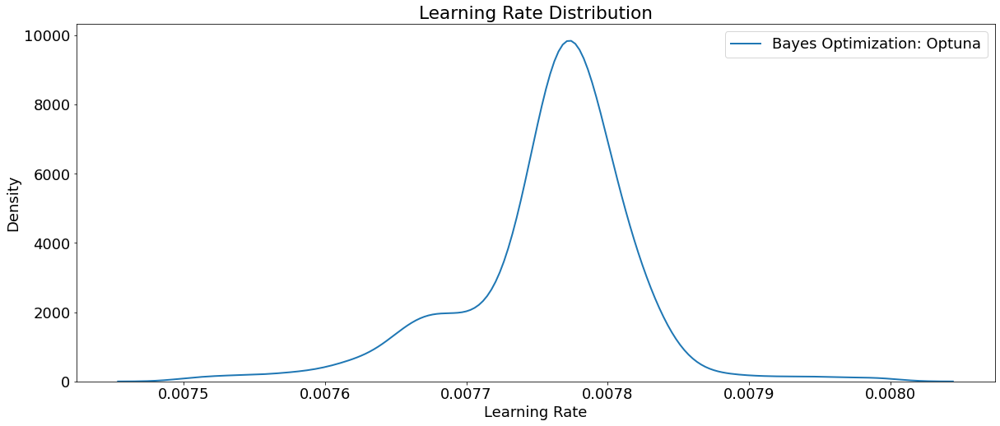

In [ ]:
# Density plots of the learning rate distributions 
plt.figure(figsize=(20,8))
plt.rcParams['font.size'] = 18
sns.kdeplot(trials_df['learning_rate'], label='Bayes Optimization: Optuna', 
            linewidth=2)
plt.legend(loc=1)
plt.xlabel('Learning Rate'); plt.ylabel('Density'); 
plt.title('Learning Rate Distribution');
plt.show()

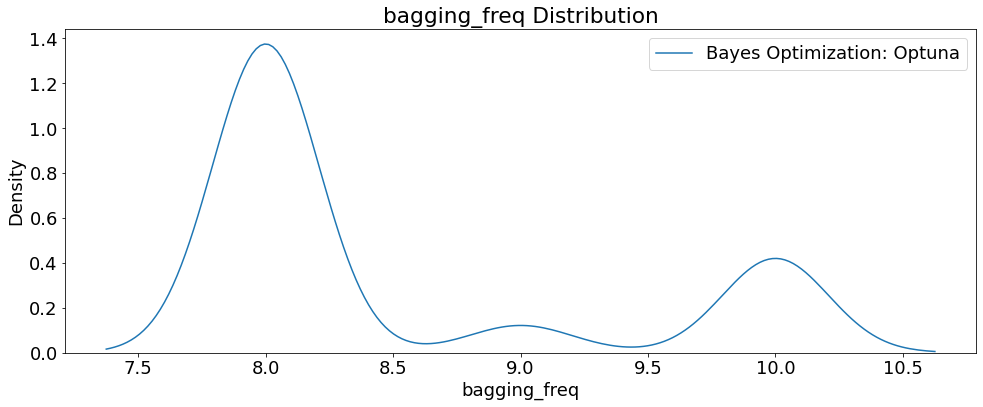

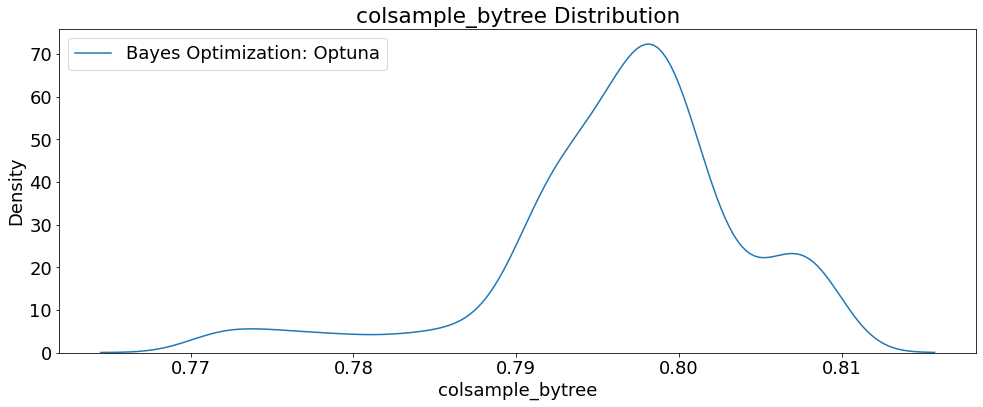

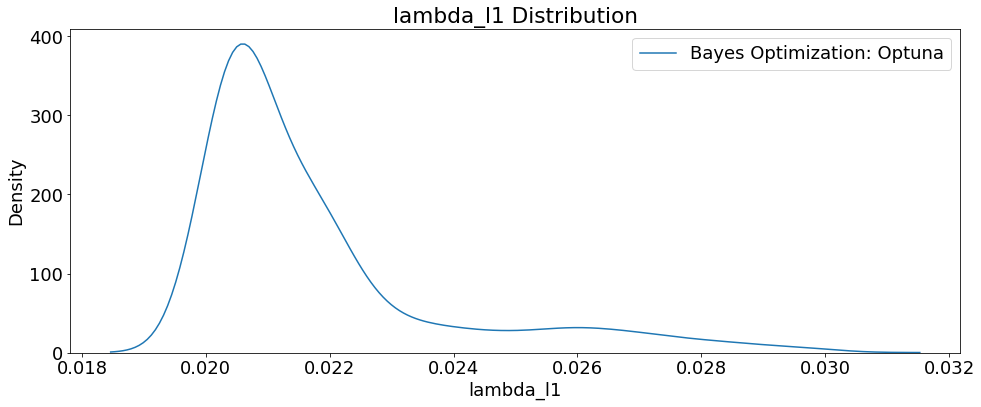

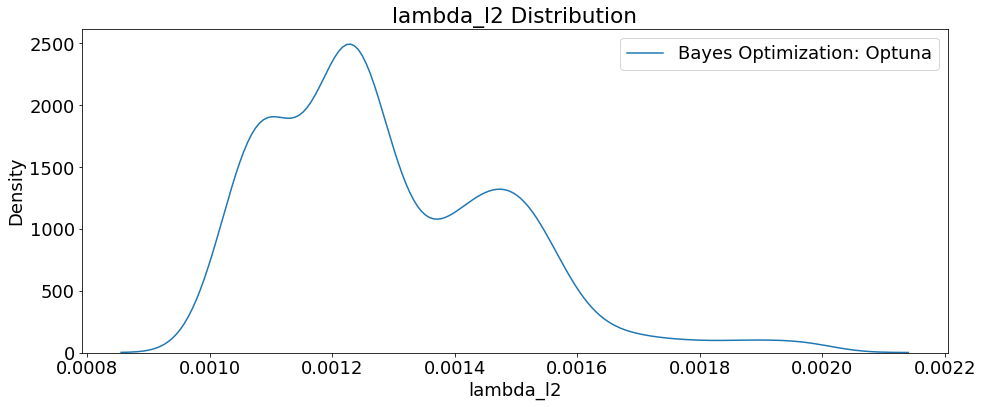

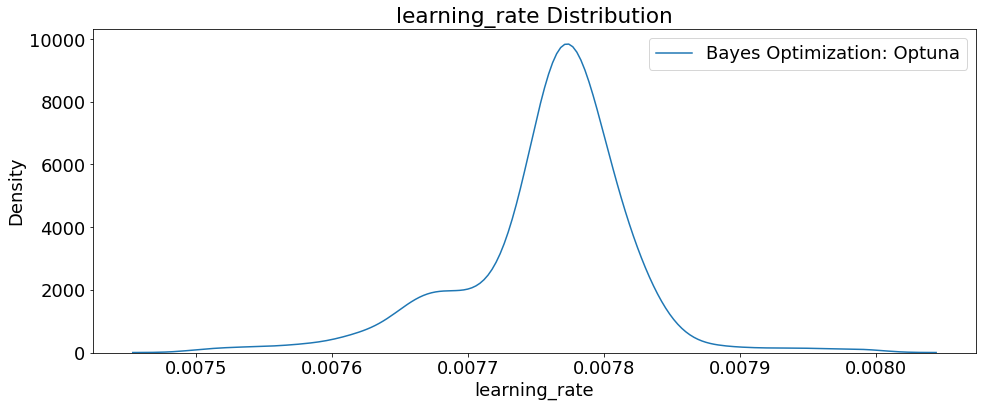

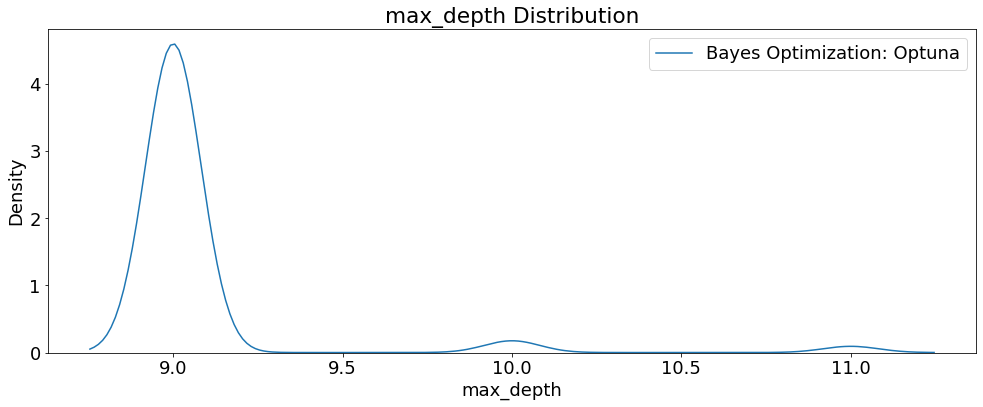

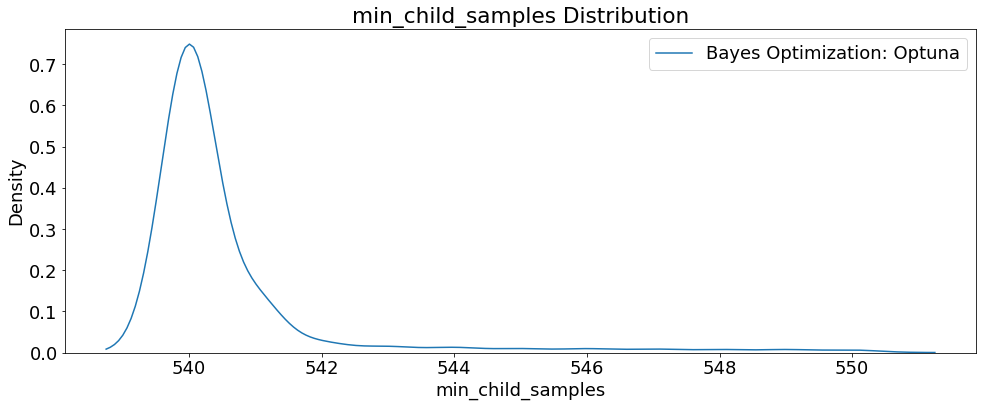

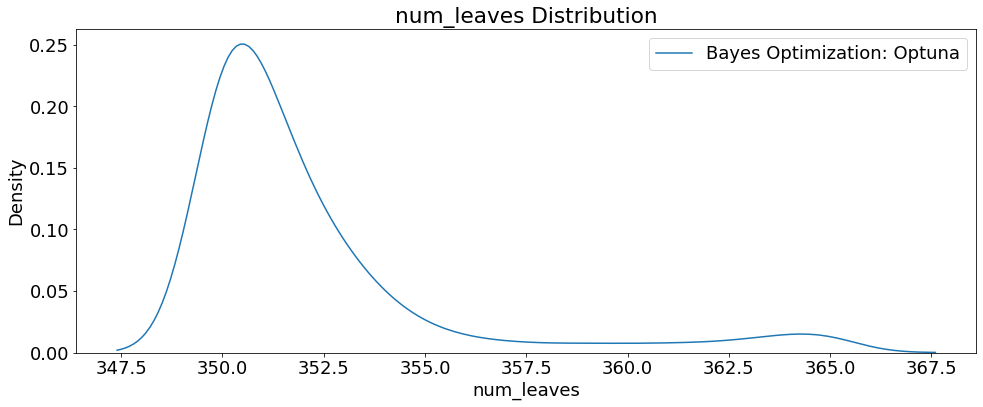

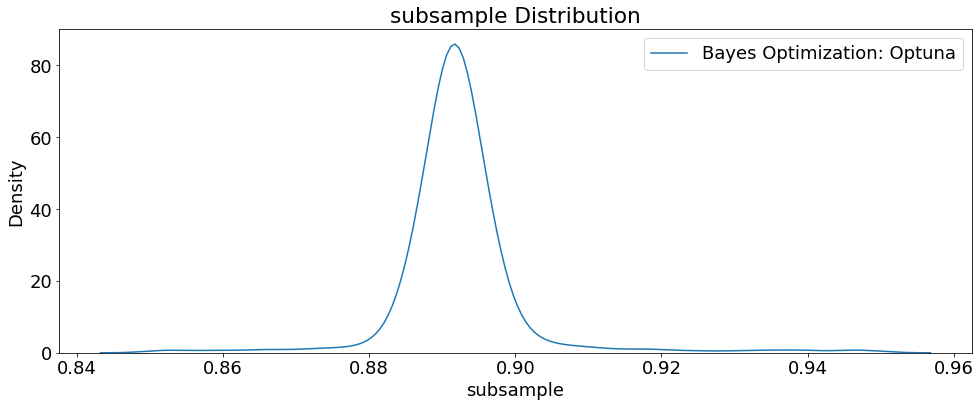

In [ ]:
# Create plots of Hyperparameters that are numeric 
for i, hpo in enumerate(trials_df.columns):
    if hpo not in ['iteration', 'rmse', 'datetime_start', 'datetime_complete',
                   'duration','n_estimators', 'state']:
        plt.figure(figsize=(14,6))
        # Plot the bayes search distribution
        if hpo != 'loss':
            sns.kdeplot(trials_df[hpo], label='Bayes Optimization: Optuna')
            plt.legend(loc=0)
            plt.title('{} Distribution'.format(hpo))
            plt.xlabel('{}'.format(hpo)); plt.ylabel('Density')
            plt.tight_layout()
            plt.show()

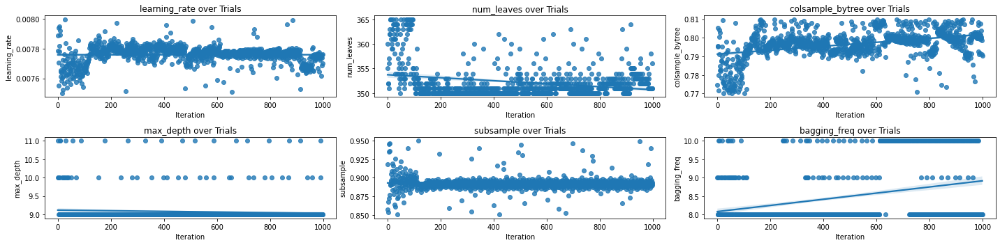

In [ ]:
# Plot quantitive hyperparameters
fig, axs = plt.subplots(2, 3, figsize=(20,5))
i = 0
axs = axs.flatten()
for i, hpo in enumerate(['learning_rate', 'num_leaves', 'colsample_bytree', 
                         'max_depth', 'subsample', 'bagging_freq']):
  # Scatterplot
  sns.regplot('iteration', hpo, data=trials_df, ax=axs[i]) 
  axs[i].set(xlabel='Iteration', ylabel='{}'.format(hpo),  
             title='{} over Trials'.format(hpo))
plt.tight_layout()
plt.show()

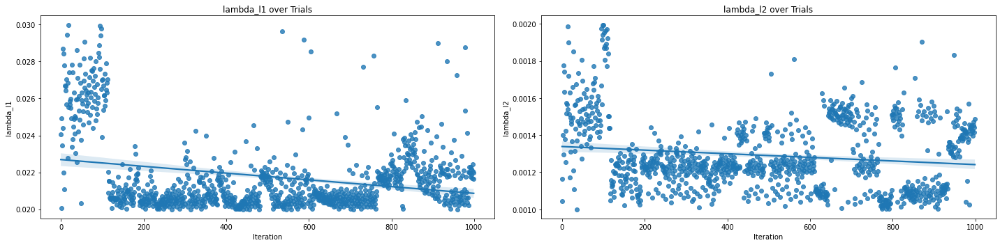

In [ ]:
# Scatterplot of regularization hyperparameters)
fig, axs = plt.subplots(1, 2, figsize=(20,5))
i = 0
for i, hpo in enumerate(['lambda_l1', 'lambda_l2']): 
  # Scatterplot
  sns.regplot('iteration', hpo, data=trials_df, ax=axs[i])
  axs[i].set(xlabel='Iteration', ylabel='{}'.format(hpo), 
             title='{} over Trials'.format(hpo))
plt.tight_layout()
plt.show()

In [ ]:
# Visualize parameter importances
fig = optuna.visualization.plot_param_importances(study)
py.plot(fig, filename='paramImportance_lightGBM_Optuna_1000_GPU.html')
fig.show()

In [ ]:
# Visualize empirical distribution function
fig = optuna.visualization.plot_edf(study)
py.plot(fig, filename='edf_lightGBM_Optuna_1000_GPU.html')
fig.show()

In [ ]:
# Arrange best parameters to fit model for model metrics
params = study.best_params   
params['random_state'] = seed_value
params['metric'] = 'rmse'
params

{'bagging_freq': 8,
 'colsample_bytree': 0.7920822759524717,
 'lambda_l1': 0.020890108169272194,
 'lambda_l2': 0.001436752808601814,
 'learning_rate': 0.00771250090405548,
 'max_depth': 9,
 'metric': 'rmse',
 'min_child_samples': 540,
 'n_estimators': 935,
 'num_leaves': 353,
 'random_state': 42,
 'subsample': 0.8917218913265061}

In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/UsedCarCarGurus/Models/ML/lightGBM/Optuna/Model_PKL/

/content/drive/MyDrive/UsedCarCarGurus/Models/ML/lightGBM/Optuna/Model_PKL


In [ ]:
# Define label and features
train_label = train[['price']]
train_features = train.drop(columns=['price'])

# Create test features
test_label = testDF[['price']]
test_features = testDF.drop(columns=['price'])
test_features = pd.get_dummies(test_features, drop_first=True)

In [ ]:
# Re-create the best model and train on the training data
best_model = LGBMRegressor(**params, verbosity=-1)

# Fit the model
best_model.fit(train_features, train_label)

# Save model
Pkl_Filename = 'lightGBM_Optuna_trials1000_GPU.pkl'  

with open(Pkl_Filename, 'wb') as file:  
    pickle.dump(best_model, file)

# =============================================================================
# # To load saved model
# model = joblib.load('lightGBM_Optuna_trials1000_GPU.pkl')
# print(model)
# =============================================================================

[LightGBM] [Warning] lambda_l2 is set=0.001436752808601814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.001436752808601814
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8
[LightGBM] [Warning] lambda_l1 is set=0.020890108169272194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.020890108169272194


In [ ]:
print('\nModel Metrics for lightGBM HPO UsedCars_CarGurus 1000 GPU trials')
y_train_pred = best_model.predict(train_features)
y_test_pred = best_model.predict(test_features)

print('MAE train: %.3f, test: %.3f' % (
        mean_absolute_error(y_train, y_train_pred),
        mean_absolute_error(y_test, y_test_pred)))
print('MSE train: %.3f, test: %.3f' % (
        mean_squared_error(y_train, y_train_pred),
        mean_squared_error(y_test, y_test_pred)))
print('RMSE train: %.3f, test: %.3f' % (
        mean_squared_error(y_train, y_train_pred, squared=False),
        mean_squared_error(y_test, y_test_pred, squared=False)))
print('R^2 train: %.3f, test: %.3f' % (
        r2_score(y_train, y_train_pred),
        r2_score(y_test, y_test_pred)))


Model Metrics for lightGBM HPO UsedCars_CarGurus 1000 GPU trials
MAE train: 2013.894, test: 2032.054
MSE train: 7244029.382, test: 7359105.168
RMSE train: 2691.473, test: 2712.767
R^2 train: 0.921, test: 0.919


In [ ]:
# Evaluate on the testing data 
print('The best model from optimization scores {:.5f} MSE on the test set.'.format(mean_squared_error(test_label, 
                                                                                                      y_test_pred)))
print('This was achieved using these conditions:')
print(trials_df.iloc[0])

The best model from optimization scores 7359105.16811 MSE on the test set.
This was achieved using these conditions:
iteration                                   115
rmse                                9568.149619
datetime_start       2022-04-05 21:39:28.489085
datetime_complete    2022-04-05 21:39:35.373429
duration                 0 days 00:00:06.884344
bagging_freq                                  8
colsample_bytree                       0.792082
lambda_l1                               0.02089
lambda_l2                              0.001437
learning_rate                          0.007713
max_depth                                     9
min_child_samples                           540
n_estimators                                935
num_leaves                                  353
subsample                              0.891722
state                                  COMPLETE
Name: 0, dtype: object


In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/UsedCarCarGurus/Models/ML/lightGBM/Optuna/Model_Explanations/

/content/drive/MyDrive/UsedCarCarGurus/Models/ML/lightGBM/Optuna/Model_Explanations


In [ ]:
# Training Set: Feature Importance Computed with SHAP Values
shap.initjs()
explainer = shap.TreeExplainer(best_model)
shap_values = explainer.shap_values(train_features)

<Figure size 432x288 with 0 Axes>

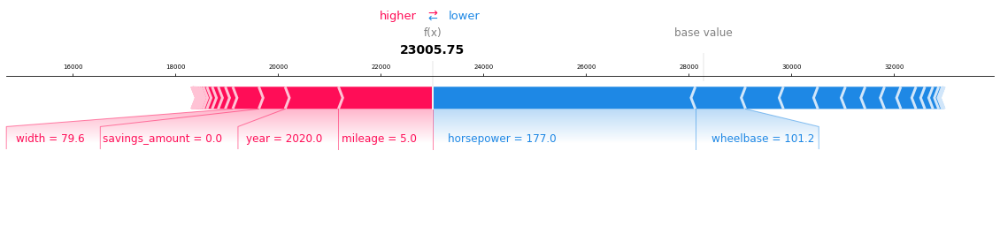

In [ ]:
# Visualize the first prediction's explanation
plt.rcParams.update({'font.size': 7})
fig = plt.figure()
shap.force_plot(explainer.expected_value, shap_values[0,:], train_features.iloc[0,:], 
                show=False, matplotlib=True).savefig('lightGBM_HPO_Optuna_1000_GPU_ShapForcePlot_TrainSet.png', 
                                                     dpi=my_dpi*10, 
                                                     bbox_inches='tight')

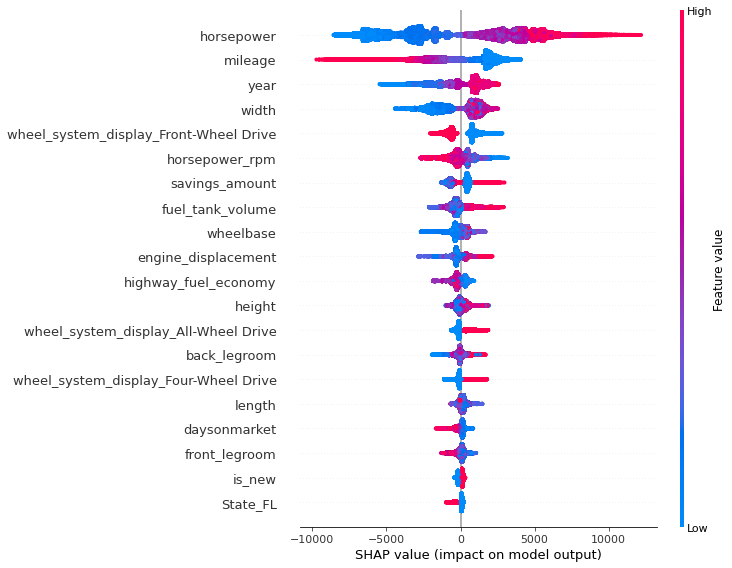

In [ ]:
# Training Set: Summarize the effects of all the features
shap.summary_plot(shap_values, train_features, show=False)
fig.savefig('lightGBM_HPO_Optuna_1000_GPU_ShapSummary_TrainSet.png', 
            dpi=my_dpi*10, 
            bbox_inches='tight')

In [ ]:
# Test Set: Feature Importance Computed with SHAP Values
shap.initjs()
shap_values = explainer.shap_values(test_features)

<Figure size 432x288 with 0 Axes>

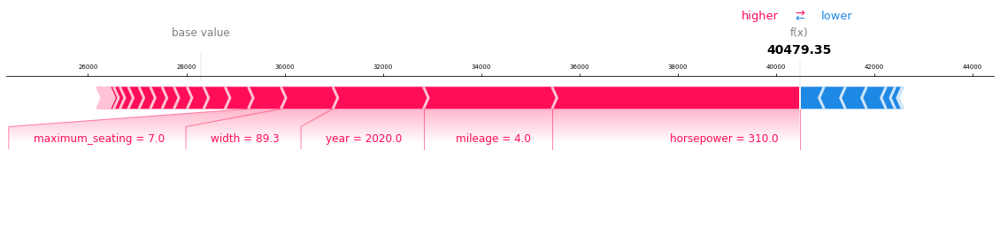

In [ ]:
# Visualize the first prediction's explanation
shap.force_plot(explainer.expected_value, shap_values[0,:], test_features.iloc[0,:], 
                show=False, matplotlib=True).savefig('lightGBM_HPO_Optuna_1000_GPU_ShapForcePlot_TestSet.png', 
                                                     dpi=my_dpi*10, 
                                                     bbox_inches='tight')

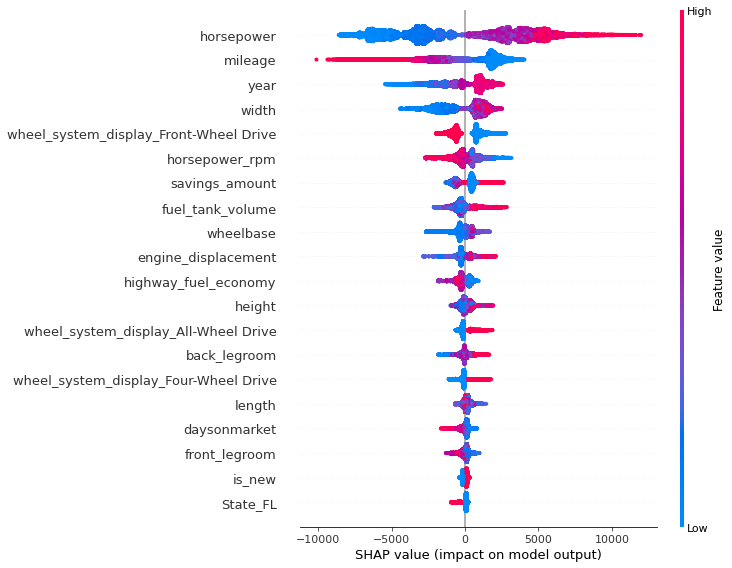

In [ ]:
# Test Set: Summarize the effects of all the features
shap.summary_plot(shap_values, test_features, show=False)
fig.savefig('lightGBM_HPO_Optuna_1000_GPU_ShapSummary_TestSet.png', 
            dpi=my_dpi*10, 
            bbox_inches='tight')

In [ ]:
# Model metrics with Eli5
# Compute permutation feature importance
perm_importance = PermutationImportance(best_model,
                                        random_state=seed_value).fit(test_features,
                                                                     test_label)

[LightGBM] [Warning] lambda_l2 is set=0.001436752808601814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.001436752808601814
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8
[LightGBM] [Warning] lambda_l1 is set=0.020890108169272194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.020890108169272194


In [ ]:
# Get the weights
X_test1 = pd.DataFrame(test_features, columns=test_features.columns)                                                                    

# Store feature weights in an object
html_obj = eli5.show_weights(perm_importance,
                             feature_names=X_test1.columns.tolist())

# Write feature weights html object to a file 
with open(r'/content/drive/MyDrive/UsedCarsCarGurus/Models/ML/lightGBM/Optuna/Model_Explanations/best_bayes_Optuna_1000_GPU_WeightsFeatures.htm',
          'wb') as f:
    f.write(html_obj.data.encode('UTF-8'))

# Open the stored feature weights HTML file
url = r'/content/drive/MyDrive/UsedCarsCarGurus/Models/ML/lightGBM/Optuna/Model_Explanations/best_bayes_Optuna_1000_GPU_WeightsFeatures.htm'
webbrowser.open(url, new=2)

html_obj

Weight,Feature
0.3959 ± 0.0028,horsepower
0.1322 ± 0.0021,mileage
0.0783 ± 0.0021,year
0.0767 ± 0.0017,width
0.0333 ± 0.0006,horsepower_rpm
0.0302 ± 0.0004,wheel_system_display_Front-Wheel Drive
0.0257 ± 0.0003,fuel_tank_volume
0.0223 ± 0.0003,engine_displacement
0.0175 ± 0.0004,wheelbase
0.0171 ± 0.0003,back_legroom


In [ ]:
# Explain weights
explanation = eli5.explain_weights_sklearn(perm_importance,
                                           feature_names=X_test1.columns.tolist())
exp = format_as_dataframe(explanation)

# Write processed data to csv
exp.to_csv('best_bayes_Optuna_1000_GPU_WeightsExplain.csv', index=False)
exp

,feature,weight,std
0,horsepower,0.395909,0.001423
1,mileage,0.132171,0.001034
2,year,0.078324,0.001031
3,width,0.076703,0.000829
4,horsepower_rpm,0.033266,0.000285
5,wheel_system_display_Front-Wheel Drive,0.030225,0.000189
6,fuel_tank_volume,0.025655,0.000147
7,engine_displacement,0.022279,0.000173
8,wheelbase,0.017455,0.000199
9,back_legroom,0.017117,0.000171


## 5000 Trials Train/Validation/Test 5 k-Fold Split

In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/UsedCarCarGurus/Models/ML/lightGBM/Optuna/Model_PKL/

/content/drive/MyDrive/UsedCarCarGurus/Models/ML/lightGBM/Optuna/Model_PKL


In [ ]:
# Define a function for optimization of hyperparameters
def objective(trial):
    
    joblib.dump(study, 'lightGBM_Optuna_5000_GPU.pkl')

    params_lgb_optuna = {
        'random_state': seed_value,
        'device_type':'gpu',
        'objective': 'regression',
        'metric': 'rmse',
        'boosting_type': 'gbdt',
        'n_estimators': trial.suggest_int('n_estimators', 400, 1000),
        'learning_rate': trial.suggest_loguniform('learning_rate', 1e-8, 1e-2),
        'num_leaves': trial.suggest_int('num_leaves', 300, 1000),
        'bagging_freq': trial.suggest_int('bagging_freq', 4, 10),
        'subsample': trial.suggest_float('subsample', 0.7, 0.9),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.7, 0.9),
        'max_depth': trial.suggest_int('max_depth', 10, 50),
        'lambda_l1': trial.suggest_float('lambda_l1', 0.0001, 0.05, log=True),
        'lambda_l2': trial.suggest_float('lambda_l2', 0.0001, 0.05,  log=True),
        'min_child_samples': trial.suggest_int('min_child_samples', 400, 1000),       
        'verbosity': -1
        }

    # Set same k-folds for reproducibility
    kf = KFold(n_splits=5, shuffle=True, random_state=seed_value)

    # Create train and validation sets
    for trn_idx, val_idx in kf.split(train[features], label): 
      train_features, train_label = train[features].iloc[trn_idx], label.iloc[trn_idx]
      val_features, val_label = train[features].iloc[val_idx], train_label.iloc[val_idx] 

      # Define model
      model = LGBMRegressor(**params_lgb_optuna, early_stopping_rounds=150)

      # Start timer for each trial
      start = timer()
      
      # Train the model
      model.fit(train_features, train_label, 
                eval_set = [(val_features, val_label), 
                            (train_features, train_label)], 
                eval_names = ['valid', 'train'])
      run_time = timer() - start

      # Predict on the model
      y_pred_val = model.predict(val_features)
      rmse = mean_squared_error(val_label, y_pred_val, squared=False)

      return rmse     

In [ ]:
# Begin HPO trials 
# Start timer for experiment
start_time = datetime.now()
print('%-20s %s' % ('Start Time', start_time))
if os.path.isfile('lightGBM_Optuna_5000.pkl'):
    study = joblib.load('lightGBM_Optuna_5000.pkl')
else:
    study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=5000)
# End timer for experiment
end_time = datetime.now()
print('%-20s %s' % ('Start Time', start_time))
print('%-20s %s' % ('End Time', end_time))
print(str(timedelta(seconds=(end_time-start_time).seconds)))
print('\n')
print('Number of finished trials:', len(study.trials))
print('Best trial:', study.best_trial.params)
print('Lowest RMSE', study.best_value)

Start Time           2022-04-04 16:49:36.825676
[LightGBM] [Warning] lambda_l2 is set=0.00017351958885492602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00017351958885492602
[LightGBM] [Warning] bagging_freq is set=10, subsample_freq=0 will be ignored. Current value: bagging_freq=10
[LightGBM] [Warning] early_stopping_round is set=150, early_stopping_rounds=150 will be ignored. Current value: early_stopping_round=150
[LightGBM] [Warning] lambda_l1 is set=0.00011644304551089386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00011644304551089386
Start Time           2022-04-04 16:49:36.825676
End Time             2022-04-05 06:06:42.506780
13:17:05


Number of finished trials: 5000
Best trial: {'n_estimators': 927, 'learning_rate': 0.007767843029617384, 'num_leaves': 358, 'bagging_freq': 9, 'subsample': 0.8963936092554716, 'colsample_bytree': 0.7976053726037338, 'max_depth': 10, 'lambda_l1': 0.026035844026317617, 'lambda_l2': 0.0015275421945347637, 'min_child_

In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/UsedCarCarGurus/Models/ML/lightGBM/Optuna/trialOptions

/content/drive/MyDrive/UsedCarCarGurus/Models/ML/lightGBM/Optuna/trialOptions


In [ ]:
# Output from HPO trials
trials_df = study.trials_dataframe()
trials_df.rename(columns={'number': 'iteration'}, inplace=True)
trials_df.rename(columns={'value': 'rmse'}, inplace=True)
trials_df.rename(columns={'params_bagging_freq': 'bagging_freq'}, inplace=True)
trials_df.rename(columns={'params_colsample_bytree': 'colsample_bytree'}, 
                 inplace=True)
trials_df.rename(columns={'params_lambda_l1': 'lambda_l1'}, inplace=True)
trials_df.rename(columns={'params_lambda_l2': 'lambda_l2'}, inplace=True)
trials_df.rename(columns={'params_learning_rate': 'learning_rate'}, inplace=True)
trials_df.rename(columns={'params_max_depth': 'max_depth'}, inplace=True)
trials_df.rename(columns={'params_min_child_samples': 'min_child_samples'}, 
                 inplace=True)
trials_df.rename(columns={'params_n_estimators': 'n_estimators'}, inplace=True)
trials_df.rename(columns={'params_num_leaves': 'num_leaves'}, inplace=True)
trials_df.rename(columns={'params_subsample': 'subsample'}, inplace=True)
trials_df = trials_df.sort_values('rmse', ascending=True)

# Write processed data to csv
trials_df.to_csv('lightGBM_Optuna_5000_GPU.csv', index=False)
print(trials_df) 

      iteration         rmse             datetime_start  \
3757       3757  9568.150263 2022-04-05 02:29:41.252505   
3492       3492  9568.150320 2022-04-05 01:44:51.662051   
2599       2599  9568.150672 2022-04-04 23:20:42.648505   
4187       4187  9568.151004 2022-04-05 03:43:02.649463   
4976       4976  9568.152099 2022-04-05 06:02:45.366627   
...         ...          ...                        ...   
69           69  9568.395599 2022-04-04 17:01:26.649854   
452         452  9568.404063 2022-04-04 17:53:49.070295   
26           26  9568.406380 2022-04-04 16:55:03.423969   
701         701  9568.416565 2022-04-04 18:31:16.114538   
90           90  9568.441082 2022-04-04 17:04:20.918644   

              datetime_complete               duration  bagging_freq  \
3757 2022-04-05 02:29:50.046728 0 days 00:00:08.794223             9   
3492 2022-04-05 01:45:00.403270 0 days 00:00:08.741219            10   
2599 2022-04-04 23:20:50.681541 0 days 00:00:08.033036             9   
418

In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/UsedCarCarGurus/Models/ML/lightGBM/Optuna/Model_Explanations/

/content/drive/MyDrive/UsedCarCarGurus/Models/ML/lightGBM/Optuna/Model_Explanations


In [ ]:
# Plot_optimization_history: shows the scores from all trials as well as the best score so far at each point.
fig = optuna.visualization.plot_optimization_history(study)
py.plot(fig, filename='optimizationHistory_lightGBM_Optuna_5000_GPU.html')
fig.show()

In [ ]:
# plot_parallel_coordinate: interactively visualizes the hyperparameters and scores
fig = optuna.visualization.plot_parallel_coordinate(study)
py.plot(fig, filename='parallelCoordinate_lightGBM_Optuna_5000_GPU.html')
fig.show()

In [ ]:
# plot_slice: shows the change of the hyperparamters space over the search. 
fig = optuna.visualization.plot_slice(study)
py.plot(fig, filename='slice_lightGBM_Optuna_5000_GPU.html')
fig.show()

In [ ]:
# plot_contour: plots parameter interactions on an interactive chart. You can choose which hyperparameters you would like to explore.
fig = optuna.visualization.plot_contour(study, params=['num_leaves', 
                                                       'max_depth', 
                                                       'subsample', 
                                                       'learning_rate', 
                                                       'subsample'])
py.plot(fig, filename='contour_lightGBM_Optuna_5000_GPU.html')
fig.show()

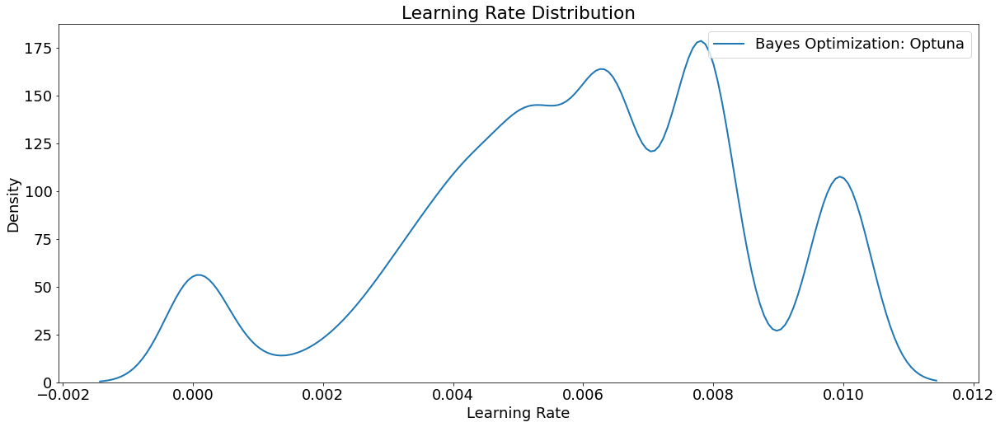

In [ ]:
# Density plots of the learning rate distributions 
plt.figure(figsize=(20,8))
plt.rcParams['font.size'] = 18
sns.kdeplot(trials_df['learning_rate'], label='Bayes Optimization: Optuna', 
            linewidth=2)
plt.legend(loc=1)
plt.xlabel('Learning Rate'); plt.ylabel('Density'); 
plt.title('Learning Rate Distribution');
plt.show()

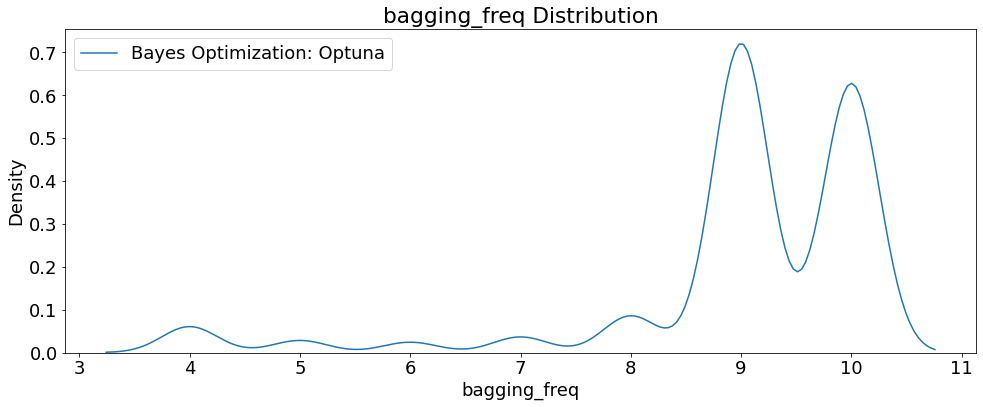

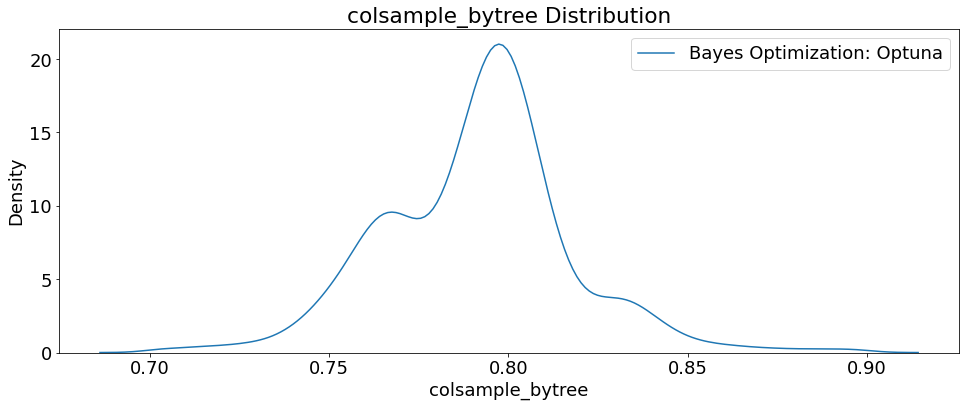

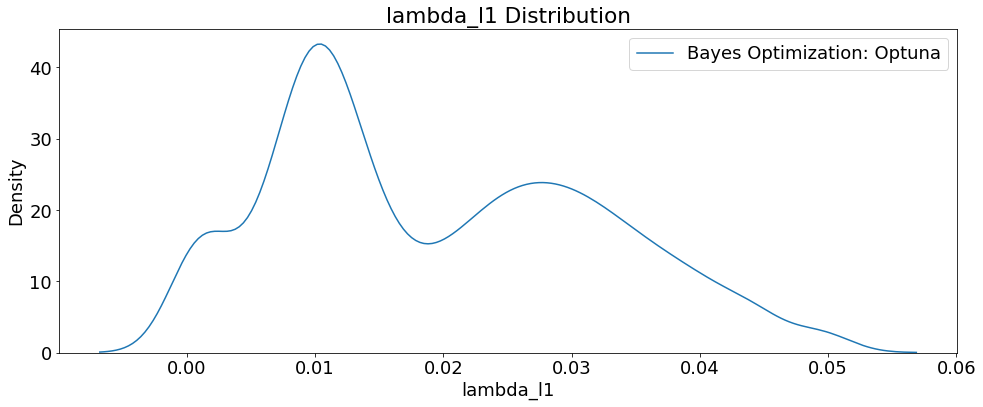

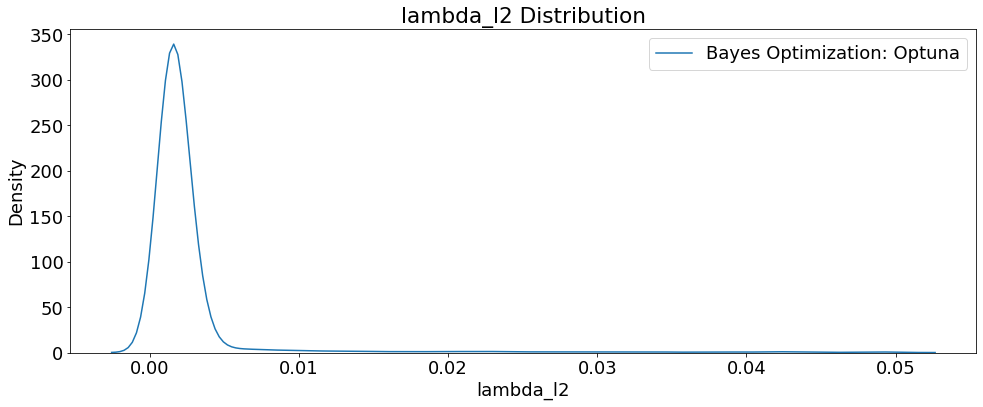

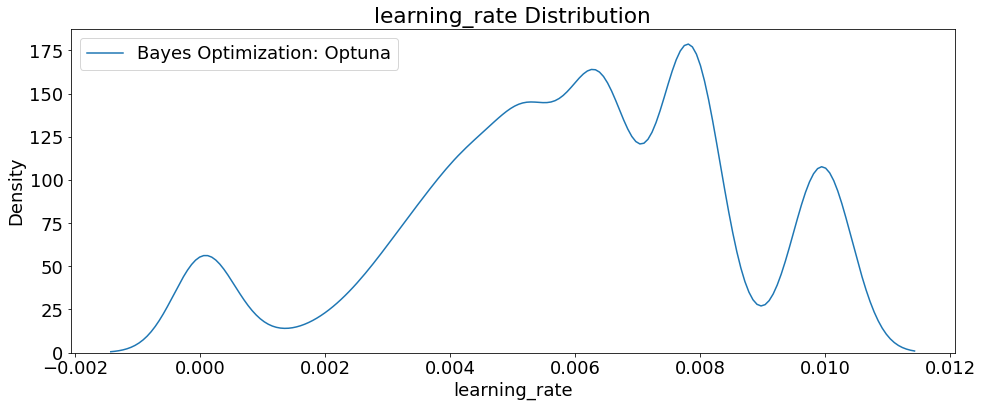

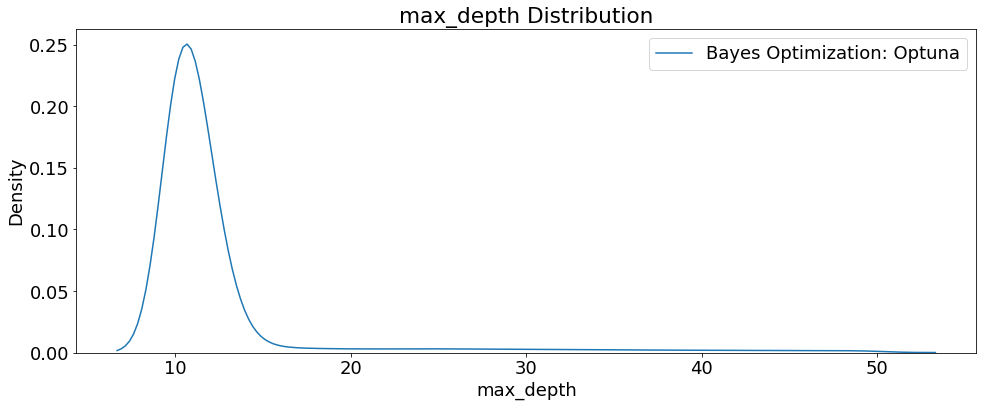

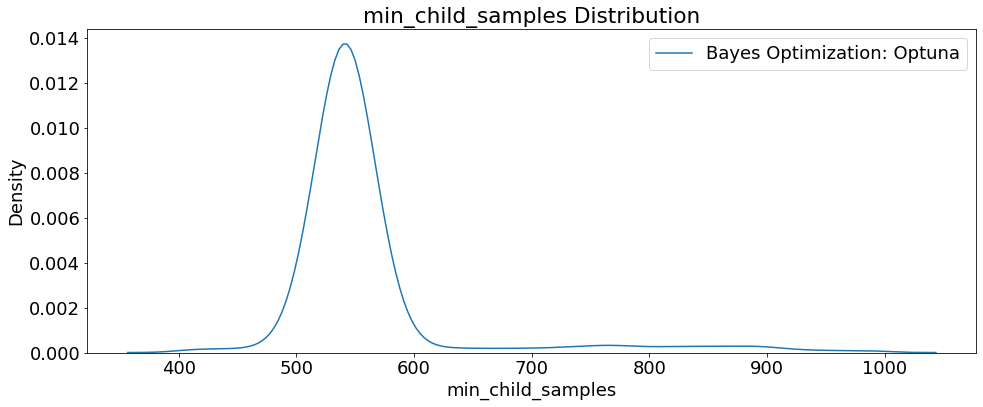

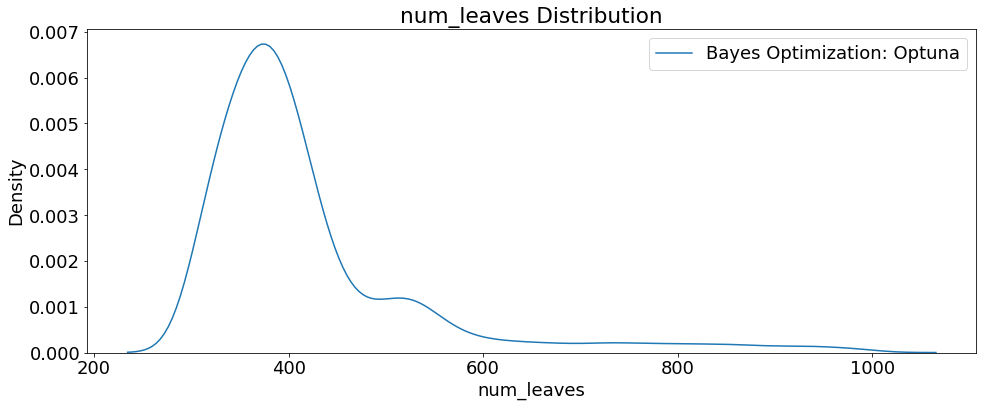

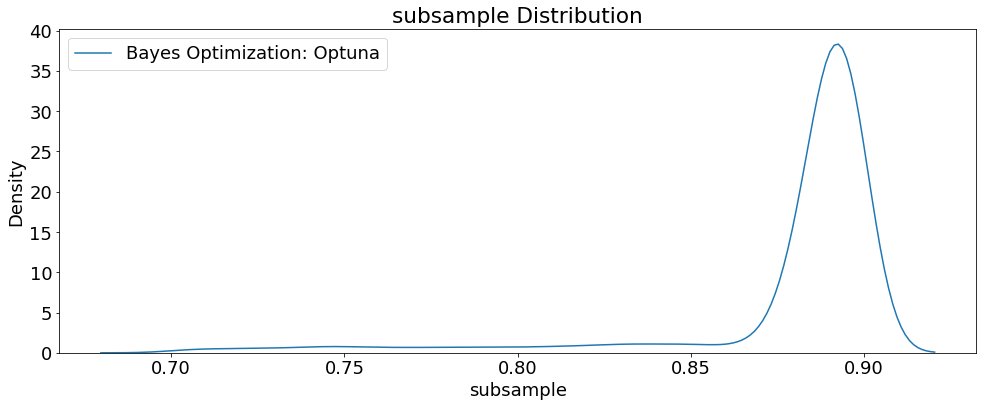

In [ ]:
# Create plots of Hyperparameters that are numeric 
for i, hpo in enumerate(trials_df.columns):
    if hpo not in ['iteration', 'rmse', 'datetime_start', 'datetime_complete',
                   'duration','n_estimators', 'state']:
        plt.figure(figsize=(14,6))
        # Plot the bayes search distribution
        if hpo != 'loss':
            sns.kdeplot(trials_df[hpo], label='Bayes Optimization: Optuna')
            plt.legend(loc=0)
            plt.title('{} Distribution'.format(hpo))
            plt.xlabel('{}'.format(hpo)); plt.ylabel('Density')
            plt.tight_layout()
            plt.show()

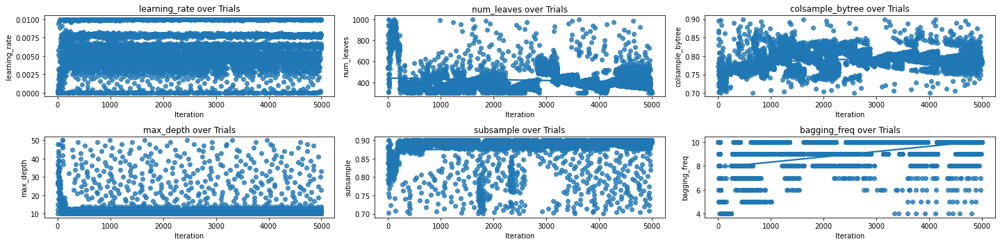

In [ ]:
# Plot quantitive hyperparameters
fig, axs = plt.subplots(2, 3, figsize=(20,5))
i = 0
axs = axs.flatten()
for i, hpo in enumerate(['learning_rate', 'num_leaves', 'colsample_bytree', 
                         'max_depth', 'subsample', 'bagging_freq']):
  # Scatterplot
  sns.regplot('iteration', hpo, data=trials_df, ax=axs[i]) 
  axs[i].set(xlabel='Iteration', ylabel='{}'.format(hpo),  
             title='{} over Trials'.format(hpo))
plt.tight_layout()
plt.show()

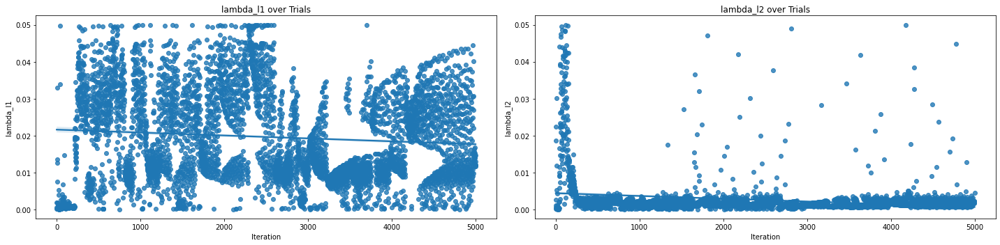

In [ ]:
# Scatterplot of regularization hyperparameters)
fig, axs = plt.subplots(1, 2, figsize=(20,5))
i = 0
for i, hpo in enumerate(['lambda_l1', 'lambda_l2']): 
  # Scatterplot
  sns.regplot('iteration', hpo, data=trials_df, ax=axs[i])
  axs[i].set(xlabel='Iteration', ylabel='{}'.format(hpo), 
            title='{} over Trials'.format(hpo))
plt.tight_layout()
plt.show()

In [ ]:
# Visualize parameter importances
fig = optuna.visualization.plot_param_importances(study)
py.plot(fig, filename='paramImportance_lightGBM_Optuna_5000_GPU.html')
fig.show()

In [ ]:
# Visualize empirical distribution function
fig = optuna.visualization.plot_edf(study)
py.plot(fig, filename='edf_lightGBM_Optuna_5000_GPU.html')
fig.show()

In [ ]:
# Arrange best parameters to fit model for model metrics
params = study.best_params   
params['random_state'] = seed_value
params['metric'] = 'rmse'
params

{'bagging_freq': 9,
 'colsample_bytree': 0.7976053726037338,
 'lambda_l1': 0.026035844026317617,
 'lambda_l2': 0.0015275421945347637,
 'learning_rate': 0.007767843029617384,
 'max_depth': 10,
 'metric': 'rmse',
 'min_child_samples': 543,
 'n_estimators': 927,
 'num_leaves': 358,
 'random_state': 42,
 'subsample': 0.8963936092554716}

In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/UsedCarCarGurus/Models/ML/lightGBM/Optuna/Model_PKL/

/content/drive/MyDrive/UsedCarCarGurus/Models/ML/lightGBM/Optuna/Model_PKL


In [ ]:
# Define label and features
train_label = train[['price']]
train_features = train.drop(columns=['price'])

# Create test features
test_label = testDF[['price']]
test_features = testDF.drop(columns=['price'])
test_features = pd.get_dummies(test_features, drop_first=True)

In [ ]:
# Re-create the best model and train on the training data
best_model = LGBMRegressor(**params, verbosity=-1)

# Fit the model
best_model.fit(train_features, train_label)

# Save model
Pkl_Filename = 'lightGBM_Optuna_trials5000_GPU.pkl'  

with open(Pkl_Filename, 'wb') as file:  
    pickle.dump(best_model, file)

# =============================================================================
# # To load saved model
# model = joblib.load('lightGBM_Optuna_trials5000_GPU.pkl')
# print(model)
# =============================================================================

[LightGBM] [Warning] lambda_l2 is set=0.0015275421945347637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0015275421945347637
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9
[LightGBM] [Warning] lambda_l1 is set=0.026035844026317617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.026035844026317617


In [ ]:
print('\nModel Metrics for lightGBM HPO UsedCars_CarGurus 5000 GPU trials')
y_train_pred = best_model.predict(train_features)
y_test_pred = best_model.predict(test_features)

print('MAE train: %.3f, test: %.3f' % (
        mean_absolute_error(y_train, y_train_pred),
        mean_absolute_error(y_test, y_test_pred)))
print('MSE train: %.3f, test: %.3f' % (
        mean_squared_error(y_train, y_train_pred),
        mean_squared_error(y_test, y_test_pred)))
print('RMSE train: %.3f, test: %.3f' % (
        mean_squared_error(y_train, y_train_pred, squared=False),
        mean_squared_error(y_test, y_test_pred, squared=False)))
print('R^2 train: %.3f, test: %.3f' % (
        r2_score(y_train, y_train_pred),
        r2_score(y_test, y_test_pred)))


Model Metrics for lightGBM HPO UsedCars_CarGurus 5000 GPU trials
MAE train: 1981.084, test: 2001.404
MSE train: 7041548.716, test: 7178379.330
RMSE train: 2653.592, test: 2679.250
R^2 train: 0.923, test: 0.921


In [ ]:
# Evaluate on the testing data 
print('The best model from optimization scores {:.5f} MSE on the test set.'.format(mean_squared_error(test_label, 
                                                                                                      y_test_pred)))
print('This was achieved using these conditions:')
print(trials_df.iloc[0])

The best model from optimization scores 7178379.33009 MSE on the test set.
This was achieved using these conditions:
iteration                                  3757
rmse                                9568.150263
datetime_start       2022-04-05 02:29:41.252505
datetime_complete    2022-04-05 02:29:50.046728
duration                 0 days 00:00:08.794223
bagging_freq                                  9
colsample_bytree                       0.797605
lambda_l1                              0.026036
lambda_l2                              0.001528
learning_rate                          0.007768
max_depth                                    10
min_child_samples                           543
n_estimators                                927
num_leaves                                  358
subsample                              0.896394
state                                  COMPLETE
Name: 0, dtype: object


In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/UsedCarCarGurus/Models/ML/lightGBM/Optuna/Model_Explanations/

/content/drive/MyDrive/UsedCarCarGurus/Models/ML/lightGBM/Optuna/Model_Explanations


In [ ]:
# Training Set: Feature Importance Computed with SHAP Values
shap.initjs()
explainer = shap.TreeExplainer(best_model)
shap_values = explainer.shap_values(train_features)

<Figure size 432x288 with 0 Axes>

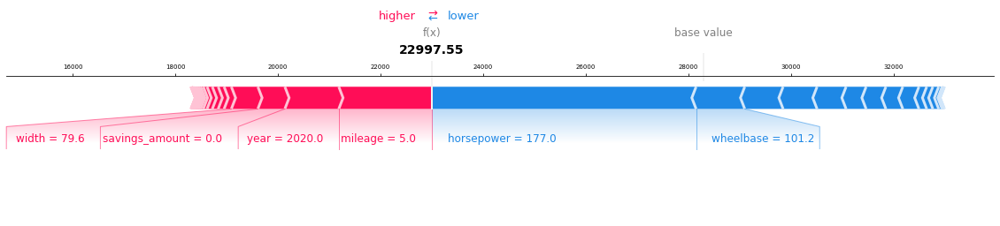

In [ ]:
# Visualize the first prediction's explanation
plt.rcParams.update({'font.size': 7})
fig = plt.figure()
shap.force_plot(explainer.expected_value, shap_values[0,:], train_features.iloc[0,:], 
                show=False, matplotlib=True).savefig('lightGBM_HPO_Optuna_5000_GPU_ShapForcePlot_TrainSet.png', 
                                                     dpi=my_dpi*10, 
                                                     bbox_inches='tight')

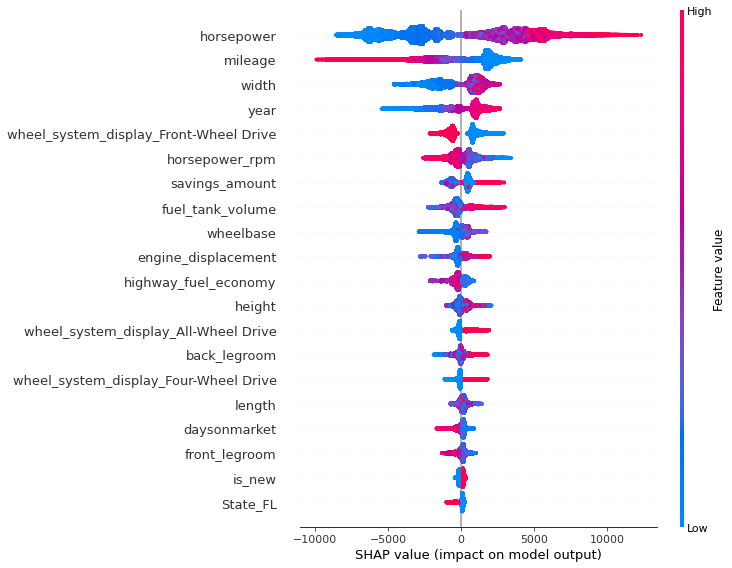

In [ ]:
# Training Set: Summarize the effects of all the features
shap.summary_plot(shap_values, train_features, show=False)
fig.savefig('lightGBM_HPO_Optuna_5000_GPU_ShapSummary_TrainSet.png', dpi=my_dpi*10, 
            bbox_inches='tight')

In [ ]:
# Test Set: Feature Importance Computed with SHAP Values
shap.initjs()
shap_values = explainer.shap_values(test_features)

<Figure size 432x288 with 0 Axes>

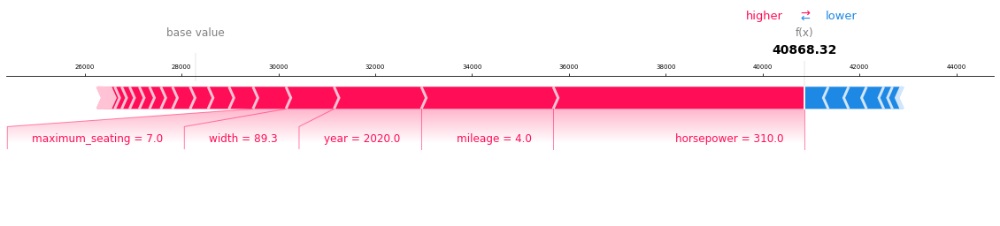

In [ ]:
# Visualize the first prediction's explanation
shap.force_plot(explainer.expected_value, shap_values[0,:], test_features.iloc[0,:], 
                show=False, matplotlib=True).savefig('lightGBM_HPO_Optuna_5000_GPU_ShapForcePlot_TestSet.png', 
                                                     dpi=my_dpi*10, 
                                                     bbox_inches='tight');

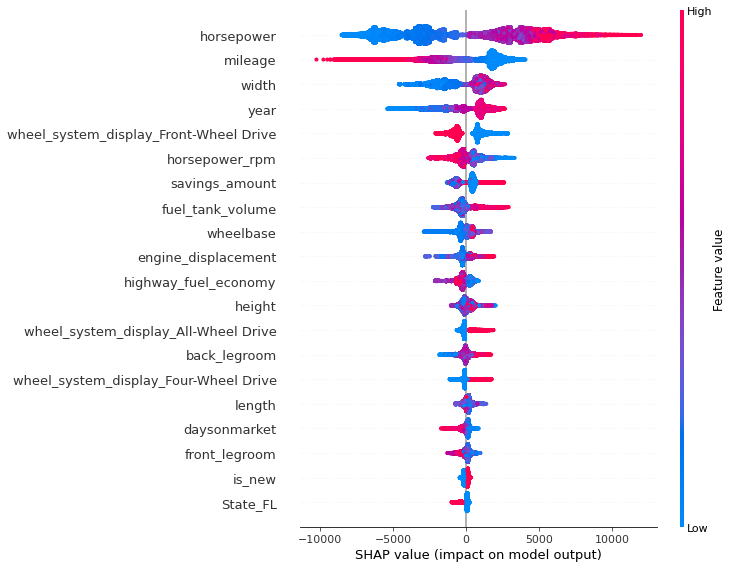

In [ ]:
# Test Set: Summarize the effects of all the features
shap.summary_plot(shap_values, test_features, show=False)
fig.savefig('lightGBM_HPO_Optuna_5000_GPU_ShapSummary_TestSet.png', 
            dpi=my_dpi*10, bbox_inches='tight')

In [ ]:
# Model metrics with Eli5
# Compute permutation feature importance
perm_importance = PermutationImportance(best_model,
                                        random_state=seed_value).fit(test_features,
                                                                     test_label)

[LightGBM] [Warning] lambda_l2 is set=0.0015275421945347637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0015275421945347637
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9
[LightGBM] [Warning] lambda_l1 is set=0.026035844026317617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.026035844026317617


In [ ]:
# Get the weights
X_test1 = pd.DataFrame(test_features, columns=test_features.columns)                                                                    

# Store feature weights in an object
html_obj = eli5.show_weights(perm_importance,
                             feature_names=X_test1.columns.tolist())

# Write feature weights html object to a file 
with open(r'/content/drive/MyDrive/UsedCarsCarGurus/Models/ML/lightGBM/Optuna/Model_Explanations/best_bayes_Optuna_5000_GPU_WeightsFeatures.htm',
          'wb') as f:
    f.write(html_obj.data.encode('UTF-8'))

# Open the stored feature weights HTML file
url = r'/content/drive/MyDrive/UsedCarsCarGurus/Models/ML/lightGBM/Optuna/Model_Explanations/best_bayes_Optuna_5000_GPU_WeightsFeatures.htm'
webbrowser.open(url, new=2)

html_obj

Weight,Feature
0.3963 ± 0.0030,horsepower
0.1321 ± 0.0021,mileage
0.0817 ± 0.0017,width
0.0797 ± 0.0020,year
0.0342 ± 0.0007,horsepower_rpm
0.0319 ± 0.0004,wheel_system_display_Front-Wheel Drive
0.0269 ± 0.0003,fuel_tank_volume
0.0218 ± 0.0004,engine_displacement
0.0182 ± 0.0003,back_legroom
0.0173 ± 0.0006,highway_fuel_economy


In [ ]:
# Explain weights
explanation = eli5.explain_weights_sklearn(perm_importance,
                                           feature_names=X_test1.columns.tolist())
exp = format_as_dataframe(explanation)

# Write processed data to csv
exp.to_csv('best_bayes_Optuna_5000_GPU_WeightsExplain.csv', index=False)
exp

,feature,weight,std
0,horsepower,0.396273,0.001487
1,mileage,0.132095,0.001054
2,width,0.081683,0.000826
3,year,0.079698,0.001007
4,horsepower_rpm,0.034193,0.000354
5,wheel_system_display_Front-Wheel Drive,0.031901,0.000183
6,fuel_tank_volume,0.026881,0.000169
7,engine_displacement,0.021833,0.000181
8,back_legroom,0.018237,0.000168
9,highway_fuel_economy,0.017335,0.000301
